[![Roboflow Notebooks](https://media.roboflow.com/notebooks/template/bannertest2-2.png?ik-sdk-version=javascript-1.4.3&updatedAt=1672932710194)](https://github.com/roboflow/notebooks)

# How to Train YOLOv12 Object Detection on a Custom Dataset

---

[![Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/roboflow-ai/notebooks/blob/main/notebooks/train-yolov12-object-detection-model.ipynb)
[![arXiv](https://img.shields.io/badge/arXiv-2502.12524-b31b1b.svg)](https://arxiv.org/abs/2502.12524)
[![Roboflow](https://raw.githubusercontent.com/roboflow-ai/notebooks/main/assets/badges/roboflow-blogpost.svg)](https://blog.roboflow.com/train-yolov12-model)
[![GitHub](https://badges.aleen42.com/src/github.svg)](https://github.com/sunsmarterjie/yolov12)

[YOLOv12](https://github.com/sunsmarterjie/yolov12) is a newly proposed attention-centric variant of the YOLO family that focuses on incorporating efficient attention mechanisms into the backbone while preserving real-time performance. Instead of relying heavily on CNN-based architectures like its predecessors, YOLOv12 introduces a simple yet powerful “area attention” module, which strategically partitions the feature map to reduce the quadratic complexity of full self-attention. It also adopts residual efficient layer aggregation networks (R-ELAN) to enhance feature aggregation and training stability, especially for larger models. These innovations, together with refinements such as scaled residual connections and a reduced MLP ratio, enable YOLOv12 to harness the benefits of attention (e.g., better global context modeling) without sacrificing speed.

![yolov12-area-attention](https://media.roboflow.com/notebooks/examples/yolov12-area-attention.png)

Compared to prior YOLO iterations (e.g., YOLOv10, YOLOv11, and YOLOv8), YOLOv12 achieves higher detection accuracy with competitive or faster inference times across all model scales. Its five sizes—N, S, M, L, and X—range from 2.6M to 59.1M parameters, striking a strong accuracy–speed balance. For instance, the smallest YOLOv12-N surpasses other “nano” models by over 1% mAP with latency around 1.6 ms on a T4 GPU, and the largest YOLOv12-X achieves 55.2% mAP, comfortably outscoring comparable real-time detectors such as RT-DETR and YOLOv11-X . By matching or exceeding state-of-the-art accuracy while remaining fast, YOLOv12 represents a notable step forward for attention-based real-time object detection.

![yolov12-metrics](https://storage.googleapis.com/com-roboflow-marketing/notebooks/examples/yolov12-metrics.png)

## Environment setup

### Configure your API keys

To fine-tune YOLOv12, you need to provide your Roboflow API key. Follow these steps:

- Go to your [`Roboflow Settings`](https://app.roboflow.com/settings/api) page. Click `Copy`. This will place your private key in the clipboard.
- In Colab, go to the left pane and click on `Secrets` (🔑). Store Roboflow API Key under the name `ROBOFLOW_API_KEY`.

In [ ]:
import os
from google.colab import userdata

os.environ["ROBOFLOW_API_KEY"] = userdata.get("ROBOFLOW_API_KEY")

### Check GPU availability

**NOTE:** **YOLOv12 leverages FlashAttention to speed up attention-based computations, but this feature requires an Nvidia GPU built on the Ampere architecture or newer—for example, GPUs like the RTX 3090, RTX 3080, or even the Nvidia L4 meet this requirement.**

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [ ]:
!nvidia-smi

/bin/bash: line 1: nvidia-smi: command not found


In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


### Install dependencies

**NOTE:** Currently, YOLOv12 does not have its own PyPI package, so we install it directly from GitHub while also adding roboflow (to conveniently pull datasets from the Roboflow Universe), supervision (to visualize inference results and benchmark the model’s performance), and flash-attn (to accelerate attention-based computations via optimized CUDA kernels).

In [ ]:
!pip install -q git+https://github.com/sunsmarterjie/yolov12.git roboflow supervision flash-attn

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 81.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.3/85.3 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 40.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 181.5/181.5 kB 12.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 102.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 70.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 87.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 47.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

### Download example data

Let's download an image we can use for YOLOv12 inference. Feel free to drag and drop your own images into the Files tab on the left-hand side of Google Colab, then reference their filenames in your code for a custom inference demo.

In [ ]:
!wget https://media.roboflow.com/notebooks/examples/dog.jpeg

--2025-05-13 01:54:58--  https://media.roboflow.com/notebooks/examples/dog.jpeg
Resolving media.roboflow.com (media.roboflow.com)... 34.110.133.209
Connecting to media.roboflow.com (media.roboflow.com)|34.110.133.209|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 106055 (104K) [image/jpeg]
Saving to: ‘dog.jpeg’

dog.jpeg            100%[===================>] 103.57K  --.-KB/s    in 0.003s  

2025-05-13 01:54:58 (30.6 MB/s) - ‘dog.jpeg’ saved [106055/106055]



## Run inference

In the example, we're using the `yolov12l.pt` model, but you can experiment with different model sizes by simply swapping out the model name during initialization. Options include `yolov12n.pt`, `yolov12s.pt`, `yolov12m.pt`, `yolov12l.pt`, and `yolov12x.pt`.

100%|██████████| 51.4M/51.4M [00:00<00:00, 265MB/s]


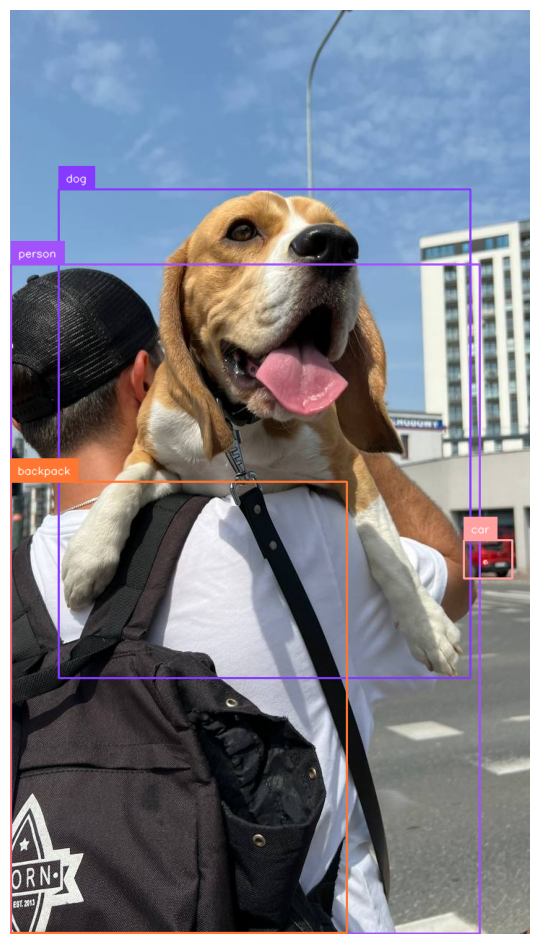

In [ ]:
import cv2
from ultralytics import YOLO
import supervision as sv


image_path = f"{HOME}/dog.jpeg"
image = cv2.imread(image_path)

model = YOLO('yolov12l.pt')

results = model(image, verbose=False)[0]
detections = sv.Detections.from_ultralytics(results)

box_annotator = sv.BoxAnnotator()
label_annotator = sv.LabelAnnotator()

annotated_image = image.copy()
annotated_image = box_annotator.annotate(scene=annotated_image, detections=detections)
annotated_image = label_annotator.annotate(scene=annotated_image, detections=detections)

sv.plot_image(annotated_image)

## Download dataset from Roboflow Universe

In [ ]:
from roboflow import download_dataset

dataset = download_dataset('https://universe.roboflow.com/josiahs-workspace/wl2-oukux/dataset/1', 'yolov8')

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to wl2-1 in yolov8:: 100%|██████████| 8624/8624 [00:01<00:00, 6228.37it/s]


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/yolov12/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
!ls {dataset.location}

data.yaml  README.dataset.txt  README.roboflow.txt  test  train  valid


**NOTE:** We need to make a few changes to our downloaded dataset so it will work with YOLOv12. Run the following bash commands to prepare your dataset for training by updating the relative paths in the `data.yaml` file, ensuring it correctly points to the subdirectories for your dataset's `train`, `test`, and `valid` subsets.

In [ ]:
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!echo -e "test: ../test/images\ntrain: ../train/images\nval: ../valid/images" >> {dataset.location}/data.yaml

In [ ]:
!cat {dataset.location}/data.yaml

names:
- 30C
- 40C
- 50C
- 60C
- 70C
- 95C
- DN_bleach
- DN_dry
- DN_dry_clean
- DN_iron
- DN_steam
- DN_tumble_dry
- DN_wash
- DN_wet_clean
- DN_wring
- bleach
- chlorine_bleach
- drip_dry
- drip_dry_in_shade
- dry_clean
- dry_clean_any_solvent
- dry_clean_any_solvent_except_trichloroethylene
- dry_clean_low_heat
- dry_clean_no_steam
- dry_clean_petrol_only
- dry_clean_reduced_moisture
- dry_clean_short_cycle
- dry_flat
- hand_wash
- iron
- iron_high
- iron_low
- iron_medium
- line_dry
- line_dry_in_shade
- machine_wash_delicate
- machine_wash_normal
- machine_wash_permanent_press
- natural_dry
- non_chlorine_bleach
- shade_dry
- steam
- tumble_dry_high
- tumble_dry_low
- tumble_dry_medium
- tumble_dry_no_heat
- tumble_dry_normal
- wet_clean
- wring
nc: 49
roboflow:
  license: CC BY 4.0
  project: wl2-oukux
  url: https://universe.roboflow.com/josiahs-workspace/wl2-oukux/dataset/1
  version: 1
test: ../test/images
train: ../train/images
val: ../valid/images


## Fine-tune YOLOv12 model

We are now ready to fine-tune our YOLOv12 model. In the code below, we initialize the model using a starting checkpoint—here, we use `yolov12s.yaml`, but you can replace it with any other model (e.g., `yolov12n.pt`, `yolov12m.pt`, `yolov12l.pt`, or `yolov12x.pt`) based on your preference. We set the training to run for 100 epochs in this example; however, you should adjust the number of epochs along with other hyperparameters such as batch size, image size, and augmentation settings (scale, mosaic, mixup, and copy-paste) based on your hardware capabilities and dataset size.

**Note:** **Note that after training, you might encounter a `TypeError: argument of type 'PosixPath' is not iterable error` — this is a known issue, but your model weights will still be saved, so you can safely proceed to running inference.**

In [ ]:
#optional

from ultralytics import YOLO

model = YOLO('yolov12s.pt')

results = model.predict("/content/road.m4p", save=True)

In [ ]:
#@title Select YOLO12 🚀 logger {run: 'auto'}
logger = 'TensorBoard' #@param ['TensorBoard', 'Weights & Biases']

if logger == 'TensorBoard':
  !yolo settings tensorboard=True
  %load_ext tensorboard
  %tensorboard --logdir .
elif logger == 'Weights & Biases':
  !yolo settings wandb=True

JSONDict("/root/.config/yolov12/settings.json"):
{
  "settings_version": "0.0.6",
  "datasets_dir": "/content/datasets",
  "weights_dir": "weights",
  "runs_dir": "runs",
  "uuid": "569f3ba64b326db489132663f79cd37279811de477381b83ac131e6cdd129cbb",
  "sync": true,
  "api_key": "",
  "openai_api_key": "",
  "clearml": true,
  "comet": true,
  "dvc": true,
  "hub": true,
  "mlflow": true,
  "neptune": true,
  "raytune": true,
  "tensorboard": true,
  "wandb": false,
  "vscode_msg": true
}
💡 Learn more about Ultralytics Settings at https://docs.ultralytics.com/quickstart/#ultralytics-settings


<IPython.core.display.Javascript object>

In [ ]:
from ultralytics import YOLO

model = YOLO('yolov12s.pt')

results = model.train(data=f'{dataset.location}/data.yaml', epochs=250, batch=64, plots=True)

100%|██████████| 17.8M/17.8M [00:00<00:00, 132MB/s] 


New https://pypi.org/project/ultralytics/8.3.131 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.63 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
engine/trainer: task=detect, mode=train, model=yolov12s.pt, data=/content/wl2-1/data.yaml, epochs=250, time=None, patience=100, batch=64, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False

100%|██████████| 755k/755k [00:00<00:00, 14.3MB/s]


Overriding model.yaml nc=80 with nc=49

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1      9344  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2, 1, 2]          
  2                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  3                  -1  1     37120  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2, 1, 4]        
  4                  -1  1    103360  ultralytics.nn.modules.block.C3k2            [128, 256, 1, False, 0.25]    
  5                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
  6                  -1  2    677120  ultralytics.nn.modules.block.A2C2f           [256, 256, 2, True, 4]        
  7                  -1  1   1180672  ultralytic

100%|██████████| 5.26M/5.26M [00:00<00:00, 64.9MB/s]


AMP: checks passed ✅


train: Scanning /content/wl2-1/train/labels... 3768 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3768/3768 [00:02<00:00, 1498.77it/s]


train: New cache created: /content/wl2-1/train/labels.cache
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 1170, len(boxes) = 23058. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


Argument(s) 'quality_lower' are not valid for transform ImageCompression
val: Scanning /content/wl2-1/valid/labels... 352 images, 0 backgrounds, 0 corrupt: 100%|██████████| 352/352 [00:00<00:00, 1175.14it/s]


val: New cache created: /content/wl2-1/valid/labels.cache
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 62, len(boxes) = 2262. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 121 weight(decay=0.0), 128 weight(decay=0.0005), 127 bias(decay=0.0)
TensorBoard: WARNING ⚠️ TensorBoard graph visualization failure Tracing failed sanity checks!
ERROR: Graphs differed across invocations!
	Graph diff:
		  graph(%self.1 : __torch__.ultralytics.nn.tasks.DetectionModel,
		        %x.1 : Tensor):
		    %model : __torch__.torch.nn.modules.container.Sequential = prim::GetAttr[name="model"](%sel

      1/250      19.1G      2.005      4.183      1.798        394        640: 100%|██████████| 59/59 [00:21<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.04s/it]

                   all        352       2262      0.402      0.303      0.137      0.073



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/250      18.7G      1.475      2.029      1.345        530        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.61it/s]

                   all        352       2262      0.353      0.544      0.369      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/250      18.8G      1.497      1.802      1.345        484        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/3 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 8.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  33%|███▎      | 1/3 [00:08<00:17,  8.92s/it]

WARNING ⚠️ NMS time limit 8.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:24<00:00,  8.10s/it]

                   all        352       2262       0.25      0.225      0.142     0.0766



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/250      18.9G      1.497      1.664      1.348        572        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:20<00:00,  6.88s/it]

                   all        352       2262      0.307       0.29      0.164      0.097



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/250      18.7G      1.459      1.527      1.333        557        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.52s/it]

                   all        352       2262      0.393      0.324      0.266       0.15



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/250      18.7G      1.437      1.429      1.323        363        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.35it/s]

                   all        352       2262      0.315      0.452      0.319      0.187



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/250      18.8G      1.422      1.344       1.32        450        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.67it/s]

                   all        352       2262       0.43      0.559      0.498      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/250      19.6G      1.406      1.287       1.31        551        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.75it/s]

                   all        352       2262      0.534      0.464      0.467       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/250      19.2G      1.381      1.229      1.307        578        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.81it/s]

                   all        352       2262      0.507      0.594      0.548      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/250      18.8G      1.361      1.154      1.287        484        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.80it/s]

                   all        352       2262      0.682      0.578      0.633      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/250      18.8G      1.365      1.133      1.286        489        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.90it/s]

                   all        352       2262      0.596      0.646      0.659      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/250      18.9G      1.343      1.082      1.288        473        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.82it/s]

                   all        352       2262       0.64      0.612      0.631      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/250      18.7G      1.326      1.027      1.268        561        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.94it/s]

                   all        352       2262      0.685      0.623      0.686      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/250      18.7G      1.324      1.007       1.26        491        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.92it/s]

                   all        352       2262       0.72      0.603      0.687      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/250      18.7G      1.316     0.9837      1.273        472        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.91it/s]

                   all        352       2262      0.654      0.618      0.648      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/250      18.8G      1.305     0.9499      1.262        438        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.93it/s]

                   all        352       2262      0.591      0.695      0.702      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/250      18.8G      1.291     0.9113      1.248        586        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]

                   all        352       2262      0.703       0.63      0.692      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/250        19G      1.285     0.9044      1.252        527        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262       0.64      0.686      0.714       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/250      18.9G      1.273     0.8824      1.246        525        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.87it/s]

                   all        352       2262       0.65      0.721      0.724      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/250      18.8G      1.257     0.8637      1.243        547        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all        352       2262      0.648      0.705      0.708      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/250        19G       1.25     0.8372      1.231        475        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.673      0.769      0.744      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/250        19G      1.232     0.8207      1.218        524        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.92it/s]

                   all        352       2262      0.644      0.746      0.724      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/250      18.7G      1.212     0.7936      1.201        569        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.93it/s]

                   all        352       2262      0.698      0.742      0.758      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/250      19.1G      1.208     0.7872      1.211        493        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.93it/s]

                   all        352       2262      0.751      0.638      0.743      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/250      19.1G      1.207     0.7771      1.199        581        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.93it/s]

                   all        352       2262       0.66      0.746      0.757      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/250      18.8G      1.187      0.757      1.205        448        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.94it/s]

                   all        352       2262      0.763      0.713      0.781      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/250      19.6G       1.18     0.7351      1.189        547        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.88it/s]

                   all        352       2262      0.698      0.749      0.786      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/250        19G      1.172     0.7381      1.178        535        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.92it/s]

                   all        352       2262      0.792      0.684       0.79      0.576



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/250      18.9G      1.148     0.7176      1.175        494        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.91it/s]

                   all        352       2262      0.696      0.756      0.782      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/250      18.7G      1.158     0.7123      1.174        654        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262      0.731      0.762      0.819      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/250      18.7G      1.132     0.6948      1.162        463        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.98it/s]

                   all        352       2262      0.724      0.744       0.76      0.549



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/250      19.5G      1.124     0.6944      1.164        505        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all        352       2262      0.826      0.746      0.809      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/250      19.2G      1.123     0.6783      1.165        447        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.98it/s]

                   all        352       2262      0.699      0.809      0.823      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/250      19.1G      1.095     0.6702      1.137        538        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262      0.785       0.78      0.816      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/250      18.8G      1.107     0.6721      1.148        483        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.92it/s]

                   all        352       2262      0.782      0.765      0.834      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/250      18.7G      1.095     0.6599      1.145        366        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.89it/s]

                   all        352       2262      0.754      0.786       0.84      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/250      18.8G      1.082     0.6509      1.139        520        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262       0.73      0.797       0.81      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/250      19.1G      1.081     0.6486      1.136        495        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all        352       2262      0.822      0.753      0.825      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/250      18.7G      1.063     0.6349      1.126        533        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.94it/s]

                   all        352       2262      0.775      0.793      0.827      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/250      18.8G      1.051     0.6172       1.12        451        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.98it/s]

                   all        352       2262      0.764      0.787      0.842      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/250      19.1G      1.058     0.6279      1.126        407        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262      0.787      0.804      0.848      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/250        19G      1.045     0.6128      1.117        541        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.93it/s]

                   all        352       2262      0.794      0.765      0.845      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/250      19.1G      1.038     0.6206      1.121        497        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262       0.75      0.801      0.833      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/250      18.9G      1.021     0.5943      1.105        454        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.94it/s]

                   all        352       2262       0.76      0.795       0.85      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/250      18.8G      1.026     0.5966      1.106        472        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.94it/s]

                   all        352       2262      0.815      0.785      0.852      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/250      19.6G      1.005     0.5793      1.091        497        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all        352       2262      0.739      0.819      0.843      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/250        19G      1.009     0.5934      1.099        493        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.91it/s]

                   all        352       2262      0.796      0.809      0.863      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/250        19G     0.9957     0.5821       1.09        425        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262       0.86      0.781      0.875      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/250      19.1G      1.001      0.578      1.089        574        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all        352       2262      0.766      0.796      0.844      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/250        19G     0.9873       0.58      1.087        502        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all        352       2262      0.835      0.819      0.872      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/250      18.8G     0.9822     0.5659      1.077        465        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all        352       2262      0.784      0.846       0.87      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/250        19G     0.9796     0.5665      1.075        548        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all        352       2262      0.791      0.812      0.853       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/250      18.9G     0.9683     0.5694      1.077        626        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262      0.877      0.778      0.873      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/250      18.8G     0.9606     0.5539      1.067        534        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.94it/s]

                   all        352       2262      0.863      0.789      0.881       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/250      18.9G     0.9625     0.5498      1.071        477        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.91it/s]

                   all        352       2262      0.881      0.793      0.869      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/250      18.8G     0.9487     0.5486      1.068        478        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.94it/s]

                   all        352       2262      0.817      0.854      0.894      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/250      19.4G      0.949     0.5419      1.062        606        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.98it/s]

                   all        352       2262      0.868      0.828      0.892      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/250      18.7G     0.9341     0.5433      1.058        443        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all        352       2262      0.841      0.825      0.886       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/250      18.9G     0.9273     0.5403      1.057        477        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.94it/s]

                   all        352       2262      0.886      0.834      0.891      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/250      18.7G     0.9276      0.538      1.057        556        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262      0.889      0.796      0.882       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/250        19G     0.9223      0.535      1.048        430        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.876      0.817      0.879      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/250      19.1G     0.9178     0.5356      1.052        458        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.93it/s]

                   all        352       2262      0.884      0.818      0.891        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/250      18.9G     0.9055     0.5293      1.046        571        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262      0.869      0.809      0.857      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/250      18.7G     0.9083     0.5235      1.039        495        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.826      0.844      0.883      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/250      18.9G      0.904     0.5251      1.048        458        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.89it/s]

                   all        352       2262      0.857      0.827      0.885      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/250      19.1G     0.8973     0.5117      1.038        492        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.89it/s]

                   all        352       2262      0.866      0.834      0.892      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/250        19G     0.8958       0.52       1.03        437        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.92it/s]

                   all        352       2262       0.81      0.852       0.88      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/250      19.7G     0.8815      0.505      1.027        467        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262       0.85       0.85       0.89      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/250      19.1G     0.8702     0.5028      1.034        467        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262      0.859       0.83      0.884      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/250        19G     0.8824     0.5092      1.032        452        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.853      0.844      0.889      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/250      19.1G     0.8805     0.5119      1.033        474        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.98it/s]

                   all        352       2262      0.871      0.839      0.884      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/250      18.8G     0.8732     0.4998      1.025        550        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.88it/s]

                   all        352       2262      0.849      0.847      0.881      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/250      18.7G     0.8732     0.5026      1.027        488        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.94it/s]

                   all        352       2262      0.882      0.839      0.887      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/250      19.1G     0.8511     0.4883      1.013        586        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.94it/s]

                   all        352       2262      0.899      0.852      0.905      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/250        19G      0.855      0.483      1.016        556        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.99it/s]

                   all        352       2262      0.919      0.829      0.889      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/250      19.2G     0.8563     0.4927      1.019        471        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.98it/s]

                   all        352       2262      0.855      0.877      0.901      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/250      19.8G     0.8442     0.4824      1.012        448        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262      0.916      0.847      0.893      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/250        19G     0.8434     0.4801      1.009        509        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262      0.866      0.837      0.888      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/250        19G     0.8391     0.4833      1.009        501        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.90it/s]

                   all        352       2262      0.915      0.852      0.902      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/250      18.8G     0.8416     0.4845      1.006        562        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.98it/s]

                   all        352       2262      0.872      0.852      0.887      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/250      19.5G     0.8305     0.4798      1.002        495        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all        352       2262      0.878      0.861      0.899       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/250        19G     0.8335     0.4821      1.011        668        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.98it/s]

                   all        352       2262       0.89      0.854      0.895      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/250      18.8G     0.8171      0.469     0.9981        469        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.93it/s]

                   all        352       2262      0.876      0.858      0.902      0.723



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/250      18.7G      0.827      0.471      1.006        538        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.93it/s]

                   all        352       2262      0.883      0.847      0.881      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/250      18.7G     0.8204     0.4706      1.001        477        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.94it/s]

                   all        352       2262      0.863      0.864      0.896      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/250      19.1G     0.8054     0.4601     0.9956        380        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.92it/s]

                   all        352       2262      0.918       0.85        0.9      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/250      18.9G     0.8157     0.4717     0.9987        499        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262      0.908      0.855      0.894      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/250      18.8G     0.8105     0.4624     0.9978        573        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.98it/s]

                   all        352       2262      0.934      0.856      0.899      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/250        19G     0.8002     0.4592     0.9903        589        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.91it/s]

                   all        352       2262      0.897      0.852      0.884      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/250      19.1G     0.7939     0.4507     0.9907        536        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.98it/s]

                   all        352       2262      0.924      0.833       0.89      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/250      19.1G     0.7984     0.4573     0.9893        533        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.902      0.847      0.902      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/250      19.3G     0.7913     0.4577     0.9849        474        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.92it/s]

                   all        352       2262      0.894      0.859        0.9      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/250      19.1G     0.7812     0.4442     0.9754        539        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262      0.916      0.837      0.889      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/250        19G     0.7845     0.4437      0.986        508        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.901      0.852      0.899      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/250      18.7G     0.7832     0.4532     0.9903        530        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.92it/s]

                   all        352       2262      0.875      0.861      0.895      0.723



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/250        19G     0.7739     0.4401     0.9848        461        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.864      0.863      0.893      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/250      18.8G      0.765     0.4321     0.9783        542        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.911      0.843      0.899      0.736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/250      18.8G     0.7691      0.437     0.9747        524        640: 100%|██████████| 59/59 [00:20<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.93it/s]

                   all        352       2262      0.889      0.859      0.895      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/250      18.7G     0.7603     0.4336     0.9735        546        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.93it/s]

                   all        352       2262      0.936      0.842      0.901       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/250      18.9G     0.7578     0.4361     0.9727        473        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.93it/s]

                   all        352       2262      0.877      0.853      0.898      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/250      19.1G     0.7623     0.4425     0.9739        448        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.91it/s]

                   all        352       2262      0.885       0.86      0.896      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/250      18.9G     0.7679     0.4386     0.9781        397        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.93it/s]

                   all        352       2262      0.895      0.841      0.898      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/250      19.1G     0.7459     0.4258     0.9671        729        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.913      0.839      0.898      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/250      18.7G     0.7418      0.431     0.9663        580        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all        352       2262      0.861      0.881      0.898      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/250      19.2G     0.7394     0.4324     0.9649        579        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262      0.917      0.845      0.897      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/250      18.8G     0.7404     0.4245     0.9587        463        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all        352       2262      0.911      0.839      0.895      0.742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/250        19G     0.7487     0.4349     0.9675        552        640: 100%|██████████| 59/59 [00:20<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.907      0.847      0.894      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/250      19.2G     0.7335     0.4261     0.9631        533        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262        0.9       0.85      0.898      0.739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/250      18.8G     0.7389     0.4235     0.9675        464        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all        352       2262      0.943      0.837      0.904      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/250      18.7G     0.7218     0.4131     0.9572        442        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.93it/s]

                   all        352       2262      0.922      0.855      0.896      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/250      18.8G     0.7244     0.4127     0.9527        437        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.91it/s]

                   all        352       2262      0.877      0.872      0.893      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/250      18.9G     0.7209     0.4087     0.9575        398        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all        352       2262      0.938       0.84      0.897       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/250      18.8G     0.7215     0.4178     0.9568        408        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.93it/s]

                   all        352       2262      0.919      0.858      0.891      0.744



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/250      19.2G     0.7146     0.4123     0.9544        452        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all        352       2262      0.903      0.852      0.886      0.738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/250        19G     0.7165     0.4029     0.9545        473        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.98it/s]

                   all        352       2262      0.898      0.857        0.9      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/250      18.8G     0.7066     0.4003     0.9481        511        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all        352       2262      0.891      0.873      0.892      0.738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/250      19.7G     0.7121     0.4101     0.9538        466        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.921      0.848      0.896       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/250      18.9G     0.7136     0.4106     0.9501        517        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all        352       2262      0.919      0.861      0.901      0.754



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/250        19G      0.702     0.4011     0.9477        444        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262      0.941       0.84      0.902      0.747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/250        19G     0.7057     0.4066     0.9521        396        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.93it/s]

                   all        352       2262      0.946      0.865      0.904      0.753



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/250      18.7G     0.6929     0.3993     0.9417        430        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.935      0.852      0.898       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/250      19.1G     0.6903     0.4015     0.9421        463        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.934      0.861      0.898      0.742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/250      18.8G      0.695     0.4007     0.9441        449        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262      0.933      0.857      0.897      0.749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/250      19.1G     0.6948     0.4066     0.9512        508        640: 100%|██████████| 59/59 [00:20<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all        352       2262      0.932      0.858      0.898      0.748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/250      18.7G     0.6915     0.3951     0.9443        532        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262       0.91      0.856      0.899      0.747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/250      19.1G     0.6814     0.3899     0.9396        482        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262      0.914      0.849      0.897      0.743



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/250      19.1G     0.6747      0.388     0.9351        501        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.98it/s]

                   all        352       2262       0.91      0.862      0.899       0.75



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/250      18.8G     0.6745     0.3888     0.9307        529        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.92it/s]

                   all        352       2262      0.913      0.852      0.896      0.744



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/250        19G     0.6734     0.3859     0.9353        450        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.92it/s]

                   all        352       2262      0.947       0.85      0.893      0.741



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/250      19.2G      0.673     0.3913     0.9373        472        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.924      0.856      0.901      0.747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/250      19.1G     0.6781     0.3951       0.94        560        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.92it/s]

                   all        352       2262      0.946      0.853      0.902      0.749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/250      18.8G     0.6687     0.3848     0.9345        423        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.92it/s]

                   all        352       2262      0.911      0.852      0.892       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/250        19G     0.6653      0.379     0.9286        490        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all        352       2262      0.935      0.853      0.897       0.75



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/250      18.8G       0.66     0.3794     0.9269        576        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.94it/s]

                   all        352       2262      0.938      0.855      0.895      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/250      19.1G     0.6547     0.3725     0.9276        621        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262      0.921      0.858      0.901      0.747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/250      19.2G     0.6599     0.3799     0.9304        532        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262      0.926      0.844      0.908      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/250      18.7G     0.6577     0.3788       0.93        506        640: 100%|██████████| 59/59 [00:20<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.946      0.851      0.902      0.749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/250        19G     0.6475     0.3783      0.928        539        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.91it/s]

                   all        352       2262      0.917      0.853      0.906      0.754



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/250      18.8G     0.6526     0.3752     0.9299        382        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.94it/s]

                   all        352       2262       0.91      0.854       0.91      0.757



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/250      18.8G     0.6378       0.37     0.9221        618        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.91it/s]

                   all        352       2262      0.918      0.864      0.907      0.756



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/250      19.1G     0.6454     0.3754     0.9237        510        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.93it/s]

                   all        352       2262      0.922      0.859      0.907      0.755



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/250      18.7G     0.6396     0.3812     0.9223        548        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all        352       2262      0.921      0.858      0.906      0.756



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/250      18.8G     0.6346     0.3685     0.9205        480        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.98it/s]

                   all        352       2262      0.924      0.856      0.906      0.747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/250      19.2G     0.6349     0.3659     0.9236        424        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.925      0.854      0.904      0.753



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/250      19.2G     0.6395     0.3695      0.923        405        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all        352       2262      0.916       0.86      0.904      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/250        19G     0.6306     0.3639     0.9156        466        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262      0.912       0.86      0.902       0.75



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/250      18.7G     0.6282     0.3623     0.9184        529        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.94it/s]

                   all        352       2262      0.923      0.858        0.9       0.75



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/250        19G     0.6339     0.3689     0.9198        507        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.944      0.852      0.905      0.757



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/250        19G     0.6279     0.3676     0.9146        435        640: 100%|██████████| 59/59 [00:20<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.94it/s]

                   all        352       2262      0.934      0.859      0.903      0.754



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/250        19G     0.6202     0.3585     0.9105        502        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all        352       2262      0.939      0.859      0.905      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    151/250      18.9G      0.616     0.3583     0.9083        435        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.93it/s]

                   all        352       2262      0.939      0.859      0.907      0.761



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    152/250      19.1G     0.6181     0.3561     0.9151        473        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all        352       2262      0.941      0.856      0.905      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    153/250      18.8G     0.6089     0.3552     0.9124        499        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all        352       2262      0.946      0.853      0.906      0.761



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    154/250      19.1G     0.6113     0.3547     0.9088        438        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.945      0.856      0.906      0.762



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    155/250      19.1G     0.6157     0.3614     0.9141        578        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.924      0.855      0.905       0.76



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    156/250      18.8G      0.609     0.3513     0.9111        522        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.91it/s]

                   all        352       2262      0.928      0.854       0.91      0.762



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    157/250      19.2G     0.6024     0.3553     0.9053        487        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262      0.924      0.855      0.907      0.762



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    158/250      19.2G      0.605     0.3539     0.9034        607        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.924      0.855      0.905      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    159/250      18.9G     0.5993     0.3503     0.9074        448        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.93it/s]

                   all        352       2262      0.924      0.857      0.905      0.756



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    160/250      19.2G     0.5981     0.3546     0.9028        569        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262      0.925      0.852      0.902      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    161/250        19G     0.5985      0.349     0.9048        600        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.947      0.853      0.904      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    162/250      19.1G     0.5954     0.3498     0.9074        380        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262      0.945      0.854      0.907      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    163/250      18.9G     0.5914     0.3417     0.9017        464        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.942      0.852      0.905      0.764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    164/250      18.8G     0.5899     0.3422      0.904        487        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.98it/s]

                   all        352       2262      0.943      0.856      0.905      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    165/250      19.7G     0.5866      0.341     0.9013        543        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all        352       2262       0.92      0.861      0.906      0.764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    166/250      19.2G     0.5867     0.3424     0.9056        544        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.92it/s]

                   all        352       2262      0.911      0.858      0.906      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    167/250      19.1G      0.595     0.3504     0.9064        485        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.922      0.855      0.905      0.764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    168/250      19.2G     0.5838     0.3406     0.9019        505        640: 100%|██████████| 59/59 [00:20<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262      0.925      0.852      0.906      0.764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    169/250      18.9G     0.5849      0.344     0.9015        421        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262      0.944      0.857      0.906      0.764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    170/250      18.9G      0.577     0.3366     0.9017        475        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all        352       2262       0.94       0.86      0.905      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    171/250      18.8G     0.5775     0.3425     0.9014        498        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.91it/s]

                   all        352       2262      0.949      0.856      0.905      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    172/250      18.9G     0.5769     0.3333        0.9        519        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.98it/s]

                   all        352       2262      0.954      0.857       0.91      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    173/250      18.9G     0.5701     0.3322     0.8957        551        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.942      0.865      0.909      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    174/250      18.8G      0.579     0.3369     0.8968        444        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.943      0.864       0.91      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    175/250      19.7G     0.5691      0.337     0.8944        454        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.92it/s]

                   all        352       2262      0.949       0.86      0.909      0.766



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    176/250      19.1G     0.5659     0.3296     0.8938        477        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.941      0.863      0.907      0.761



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    177/250      18.8G      0.563     0.3339     0.8926        514        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.00it/s]

                   all        352       2262      0.943      0.859      0.908       0.76



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    178/250      18.9G     0.5644     0.3326      0.895        468        640: 100%|██████████| 59/59 [00:20<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.98it/s]

                   all        352       2262       0.94      0.859      0.908      0.764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    179/250      18.9G     0.5603     0.3296     0.8902        529        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all        352       2262      0.941      0.856      0.905      0.761



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    180/250      18.7G     0.5623     0.3313     0.8941        561        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.93it/s]

                   all        352       2262      0.941      0.856       0.91      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    181/250      18.7G     0.5535     0.3258     0.8926        437        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.92it/s]

                   all        352       2262      0.942      0.857      0.909      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    182/250      19.2G     0.5451     0.3234     0.8914        476        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.98it/s]

                   all        352       2262      0.943      0.856       0.91      0.766



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    183/250      18.7G     0.5512     0.3268     0.8924        404        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.94it/s]

                   all        352       2262      0.942      0.857      0.906      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    184/250      18.7G     0.5537     0.3242     0.8872        476        640: 100%|██████████| 59/59 [00:20<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.91it/s]

                   all        352       2262      0.943      0.856      0.907      0.766



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    185/250      18.9G      0.541     0.3183      0.884        666        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.91it/s]

                   all        352       2262      0.944      0.857      0.907      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    186/250      18.7G     0.5434     0.3242      0.888        553        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.944      0.858      0.909       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    187/250      18.9G     0.5469     0.3221     0.8892        445        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.93it/s]

                   all        352       2262      0.945      0.856      0.906      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    188/250      19.6G     0.5285     0.3099     0.8828        541        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262      0.942      0.858      0.908      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    189/250      18.7G     0.5331     0.3219     0.8868        477        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.943      0.857      0.907      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    190/250      18.8G      0.542     0.3217     0.8863        477        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.942       0.86      0.909      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    191/250      18.9G     0.5337     0.3144     0.8822        581        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.943      0.859       0.91      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    192/250      19.5G     0.5359     0.3213     0.8851        445        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all        352       2262      0.943       0.86       0.91       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    193/250      18.8G     0.5385      0.321     0.8865        439        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.942      0.861       0.91      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    194/250      18.8G     0.5286     0.3116     0.8843        475        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262      0.941      0.859      0.908      0.773



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    195/250      18.9G     0.5299     0.3116       0.88        463        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.94it/s]

                   all        352       2262      0.938      0.863       0.91      0.773



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    196/250      18.7G     0.5192     0.3084     0.8781        533        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.94it/s]

                   all        352       2262      0.939      0.863       0.91      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    197/250      19.1G     0.5235       0.31     0.8796        470        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.98it/s]

                   all        352       2262      0.939      0.864      0.909      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    198/250      19.1G      0.516     0.3065     0.8758        512        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all        352       2262      0.941      0.863       0.91      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    199/250        19G     0.5203     0.3071     0.8763        534        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.942      0.865       0.91      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    200/250      18.9G     0.5153     0.3039     0.8763        419        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262      0.942      0.865       0.91      0.773



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    201/250      19.2G     0.5158     0.3049     0.8787        545        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.98it/s]

                   all        352       2262      0.943      0.865       0.91      0.773



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    202/250      19.1G     0.5105      0.306     0.8757        603        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all        352       2262      0.946      0.864       0.91      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    203/250      18.7G     0.5136      0.309     0.8804        553        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.84it/s]

                   all        352       2262      0.943      0.863       0.91      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    204/250      18.8G     0.5083     0.3058      0.875        434        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.93it/s]

                   all        352       2262      0.942      0.863       0.91       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    205/250        19G     0.5123     0.3089     0.8765        439        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.942      0.862      0.909      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    206/250        19G     0.5036     0.2992     0.8727        511        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.98it/s]

                   all        352       2262      0.944      0.863      0.908      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    207/250      19.1G     0.5019     0.3036      0.874        486        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262      0.943      0.864      0.908      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    208/250        19G     0.4994     0.3003     0.8709        537        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all        352       2262      0.942      0.864      0.908      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    209/250      18.9G     0.5027     0.2998     0.8739        457        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.942      0.864      0.908      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    210/250      19.1G     0.4971      0.298     0.8724        495        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all        352       2262      0.942      0.864      0.908      0.766



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    211/250      19.1G     0.4998     0.3014      0.874        509        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.944      0.865      0.908      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    212/250      18.8G     0.4956     0.2963      0.873        527        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262      0.945      0.863      0.908      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    213/250      19.1G     0.4917     0.2928     0.8685        439        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.89it/s]

                   all        352       2262      0.945      0.863      0.908      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    214/250      19.1G     0.4924     0.2919     0.8681        536        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all        352       2262      0.944      0.863      0.908       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    215/250      18.9G     0.4894     0.2935     0.8695        483        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.93it/s]

                   all        352       2262      0.943      0.863      0.908       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    216/250        19G     0.4903     0.2966     0.8704        510        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262      0.944      0.862      0.909       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    217/250      18.7G     0.4794     0.2895     0.8648        475        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262      0.944      0.862      0.909      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    218/250      19.2G     0.4786     0.2868     0.8672        480        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.944      0.862      0.909      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    219/250        19G     0.4746     0.2862     0.8631        409        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.98it/s]

                   all        352       2262      0.944      0.861      0.908      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    220/250        19G     0.4842     0.2919      0.868        518        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262      0.945       0.86      0.908      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    221/250      19.1G     0.4771     0.2888     0.8638        461        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.90it/s]

                   all        352       2262      0.944      0.861      0.908      0.773



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    222/250      19.5G     0.4764     0.2895     0.8641        506        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.90it/s]

                   all        352       2262      0.945       0.86      0.907      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    223/250      18.8G      0.481     0.2947     0.8679        473        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.99it/s]

                   all        352       2262      0.944      0.861      0.908      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    224/250      18.7G     0.4739     0.2852     0.8609        503        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.94it/s]

                   all        352       2262      0.942      0.862      0.908      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    225/250      18.8G     0.4731     0.2919     0.8638        471        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.93it/s]

                   all        352       2262      0.944      0.861      0.908      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    226/250      18.9G     0.4705     0.2834     0.8594        511        640: 100%|██████████| 59/59 [00:20<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all        352       2262      0.944      0.861      0.908      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    227/250      18.7G     0.4679     0.2804     0.8596        504        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.98it/s]

                   all        352       2262      0.944       0.86      0.908      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    228/250      18.9G     0.4669     0.2786     0.8592        637        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.98it/s]

                   all        352       2262      0.944       0.86      0.907      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    229/250      19.4G     0.4628     0.2809     0.8598        467        640: 100%|██████████| 59/59 [00:20<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.93it/s]

                   all        352       2262      0.944      0.859      0.907      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    230/250      19.1G     0.4617     0.2822     0.8617        614        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all        352       2262      0.943       0.86      0.907      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    231/250        19G     0.4582     0.2782     0.8574        492        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.93it/s]

                   all        352       2262      0.943       0.86      0.907      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    232/250      18.7G     0.4555     0.2797     0.8583        489        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.944      0.859      0.907      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    233/250      18.7G     0.4587     0.2774     0.8569        452        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.98it/s]

                   all        352       2262      0.945      0.858      0.907      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    234/250      18.7G     0.4512     0.2738     0.8571        448        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262      0.944      0.858      0.907      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    235/250      18.8G      0.452     0.2764     0.8564        486        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.98it/s]

                   all        352       2262      0.945      0.858      0.907      0.773



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    236/250      19.3G     0.4534     0.2754     0.8551        536        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.92it/s]

                   all        352       2262      0.945      0.859      0.908      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    237/250      18.8G     0.4489     0.2729     0.8541        523        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.94it/s]

                   all        352       2262      0.945      0.859      0.908      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    238/250        19G     0.4451     0.2721     0.8528        550        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262      0.944      0.857      0.906      0.773



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    239/250      19.5G     0.4456     0.2729     0.8568        420        640: 100%|██████████| 59/59 [00:20<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262      0.945      0.857      0.906      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    240/250      19.2G     0.4436     0.2727     0.8522        506        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.89it/s]

                   all        352       2262      0.945      0.856      0.906      0.775


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


Argument(s) 'quality_lower' are not valid for transform ImageCompression



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    241/250      19.1G     0.4592     0.2277     0.8725        336        640: 100%|██████████| 59/59 [00:22<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.93it/s]

                   all        352       2262      0.945      0.856      0.906      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    242/250      18.9G     0.4285     0.2186     0.8597        284        640: 100%|██████████| 59/59 [00:20<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.945      0.856      0.907      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    243/250      18.7G     0.4239     0.2163     0.8573        345        640: 100%|██████████| 59/59 [00:20<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.92it/s]

                   all        352       2262      0.945      0.857      0.905      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    244/250      19.1G     0.4105     0.2128     0.8524        280        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.96it/s]

                   all        352       2262      0.945      0.856      0.904      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    245/250      18.7G     0.4042     0.2119     0.8508        361        640: 100%|██████████| 59/59 [00:20<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.94it/s]

                   all        352       2262      0.946      0.856      0.904      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    246/250      18.8G     0.4028     0.2098     0.8505        362        640: 100%|██████████| 59/59 [00:20<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.93it/s]

                   all        352       2262      0.946      0.856      0.904      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    247/250        19G     0.4052     0.2102      0.852        287        640: 100%|██████████| 59/59 [00:20<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.94it/s]

                   all        352       2262      0.946      0.856      0.904      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    248/250        19G     0.3948     0.2064     0.8479        313        640: 100%|██████████| 59/59 [00:20<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.946      0.856      0.904      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    249/250      18.9G     0.3984     0.2079     0.8458        425        640: 100%|██████████| 59/59 [00:20<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all        352       2262      0.946      0.856      0.904      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    250/250      18.9G     0.3924     0.2073     0.8458        344        640: 100%|██████████| 59/59 [00:20<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.94it/s]

                   all        352       2262      0.946      0.856      0.904      0.774



250 epochs completed in 1.588 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 18.7MB
Optimizer stripped from runs/detect/train/weights/best.pt, 18.7MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.63 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
YOLOv12s summary (fused): 376 layers, 9,093,171 parameters, 0 gradients, 19.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.03it/s]


                   all        352       2262      0.941      0.863       0.91      0.774
                   30C        152        176      0.944      0.966      0.987      0.827
                   40C        137        152      0.978      0.947       0.98      0.799
                   50C          8         15      0.933      0.926      0.954       0.85
                   60C          9         13          1       0.74       0.83      0.683
                   70C          6         11      0.962      0.909      0.981      0.864
                   95C          7         12          1      0.959      0.995      0.894
             DN_bleach        304        364      0.986      0.995      0.982      0.809
                DN_dry          6          6      0.976          1      0.995      0.925
          DN_dry_clean        177        204       0.99      0.979      0.992      0.824
               DN_iron         66         95      0.989      0.935      0.965        0.8
              DN_stea

## Evaluate fine-tuned YOLOv12 model

In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

!ls {HOME}/runs/detect/train/

args.yaml					    train_batch14160.jpg
confusion_matrix_normalized.png			    train_batch14161.jpg
confusion_matrix.png				    train_batch14162.jpg
events.out.tfevents.1746990991.8f32d0b9b9b5.4227.0  train_batch1.jpg
F1_curve.png					    train_batch2.jpg
labels_correlogram.jpg				    val_batch0_labels.jpg
labels.jpg					    val_batch0_pred.jpg
P_curve.png					    val_batch1_labels.jpg
PR_curve.png					    val_batch1_pred.jpg
R_curve.png					    val_batch2_labels.jpg
results.csv					    val_batch2_pred.jpg
results.png					    weights
train_batch0.jpg


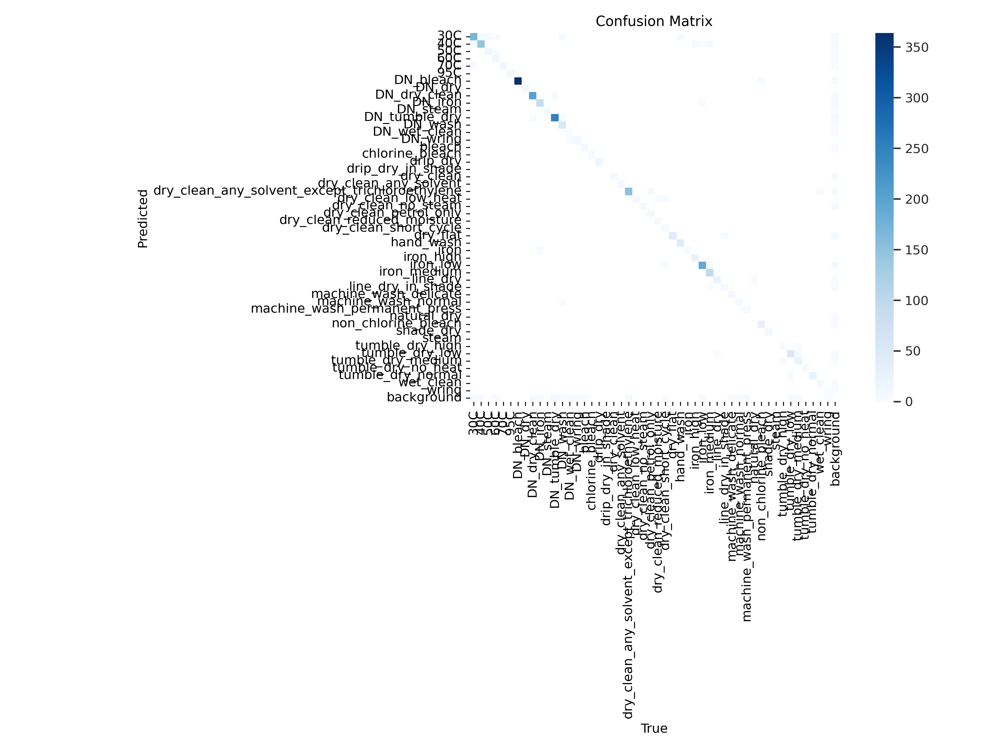

In [ ]:
from IPython.display import Image

Image(filename=f'{HOME}/runs/detect/train/confusion_matrix.png', width=1000)

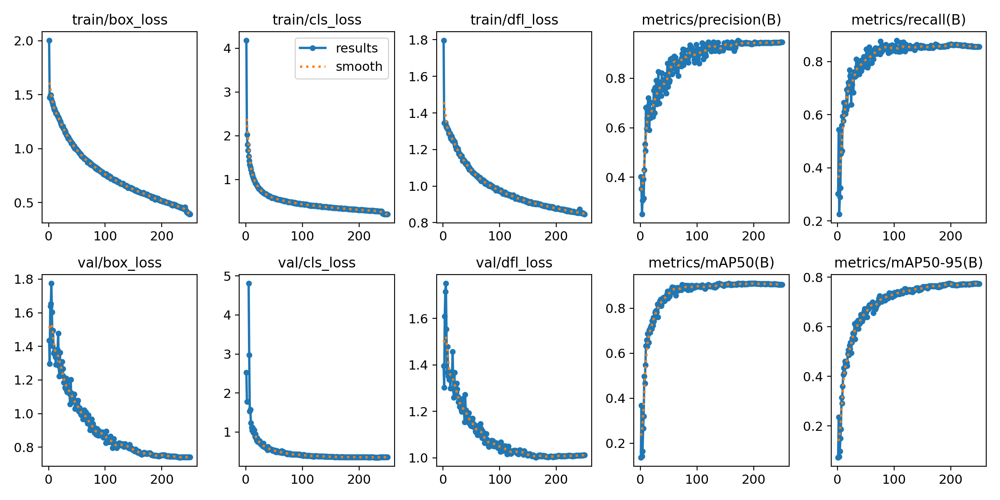

In [ ]:
from IPython.display import Image

Image(filename=f'{HOME}/runs/detect/train/results.png', width=1000)

In [ ]:
import supervision as sv

ds = sv.DetectionDataset.from_yolo(
    images_directory_path=f"{dataset.location}/test/images",
    annotations_directory_path=f"{dataset.location}/test/labels",
    data_yaml_path=f"{dataset.location}/data.yaml"
)

ds.classes

['30C',
 '40C',
 '50C',
 '60C',
 '70C',
 '95C',
 'DN_bleach',
 'DN_dry',
 'DN_dry_clean',
 'DN_iron',
 'DN_steam',
 'DN_tumble_dry',
 'DN_wash',
 'DN_wet_clean',
 'DN_wring',
 'bleach',
 'chlorine_bleach',
 'drip_dry',
 'drip_dry_in_shade',
 'dry_clean',
 'dry_clean_any_solvent',
 'dry_clean_any_solvent_except_trichloroethylene',
 'dry_clean_low_heat',
 'dry_clean_no_steam',
 'dry_clean_petrol_only',
 'dry_clean_reduced_moisture',
 'dry_clean_short_cycle',
 'dry_flat',
 'hand_wash',
 'iron',
 'iron_high',
 'iron_low',
 'iron_medium',
 'line_dry',
 'line_dry_in_shade',
 'machine_wash_delicate',
 'machine_wash_normal',
 'machine_wash_permanent_press',
 'natural_dry',
 'non_chlorine_bleach',
 'shade_dry',
 'steam',
 'tumble_dry_high',
 'tumble_dry_low',
 'tumble_dry_medium',
 'tumble_dry_no_heat',
 'tumble_dry_normal',
 'wet_clean',
 'wring']

In [ ]:
from supervision.metrics import MeanAveragePrecision

model = YOLO(f'/{HOME}/runs/detect/train/weights/best.pt')

predictions = []
targets = []

for _, image, target in ds:
    results = model(image, verbose=False)[0]
    detections = sv.Detections.from_ultralytics(results)

    predictions.append(detections)
    targets.append(target)

map = MeanAveragePrecision().update(predictions, targets).compute()

In [ ]:
print("mAP 50:95", map.map50_95)
print("mAP 50", map.map50)
print("mAP 75", map.map75)

mAP 50:95 0.7155414005507106
mAP 50 0.8184599344636303
mAP 75 0.7970931550279056


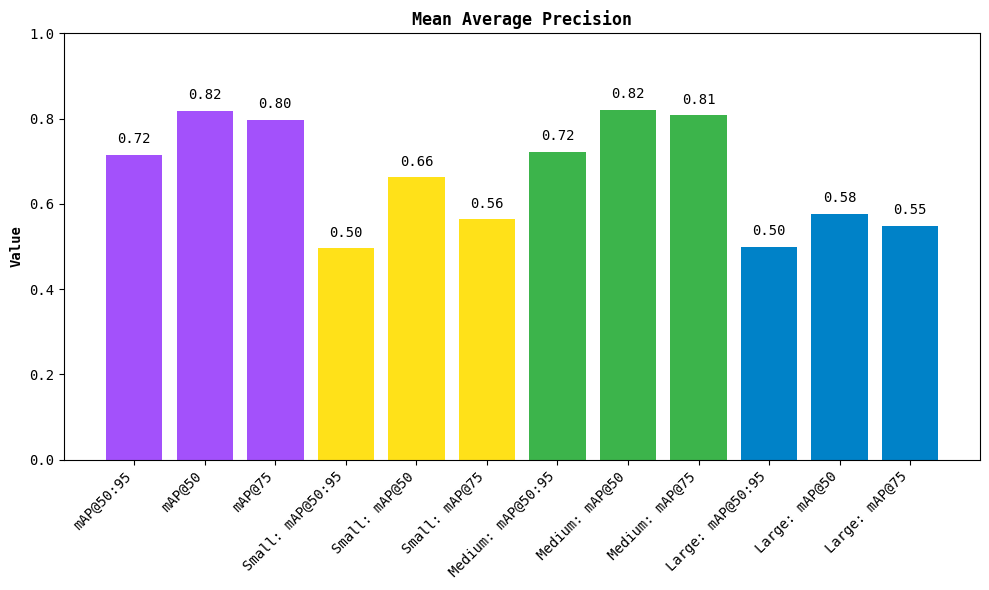

In [ ]:
map.plot()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

MessageError: Error: credential propagation was unsuccessful

## Run inference with fine-tuned YOLOv12 model

In [ ]:
import supervision as sv

model = YOLO(f'/{HOME}/runs/detect/train/weights/best.pt')

ds = sv.DetectionDataset.from_yolo(
    images_directory_path=f"{dataset.location}/test/images",
    annotations_directory_path=f"{dataset.location}/test/labels",
    data_yaml_path=f"{dataset.location}/data.yaml"
)

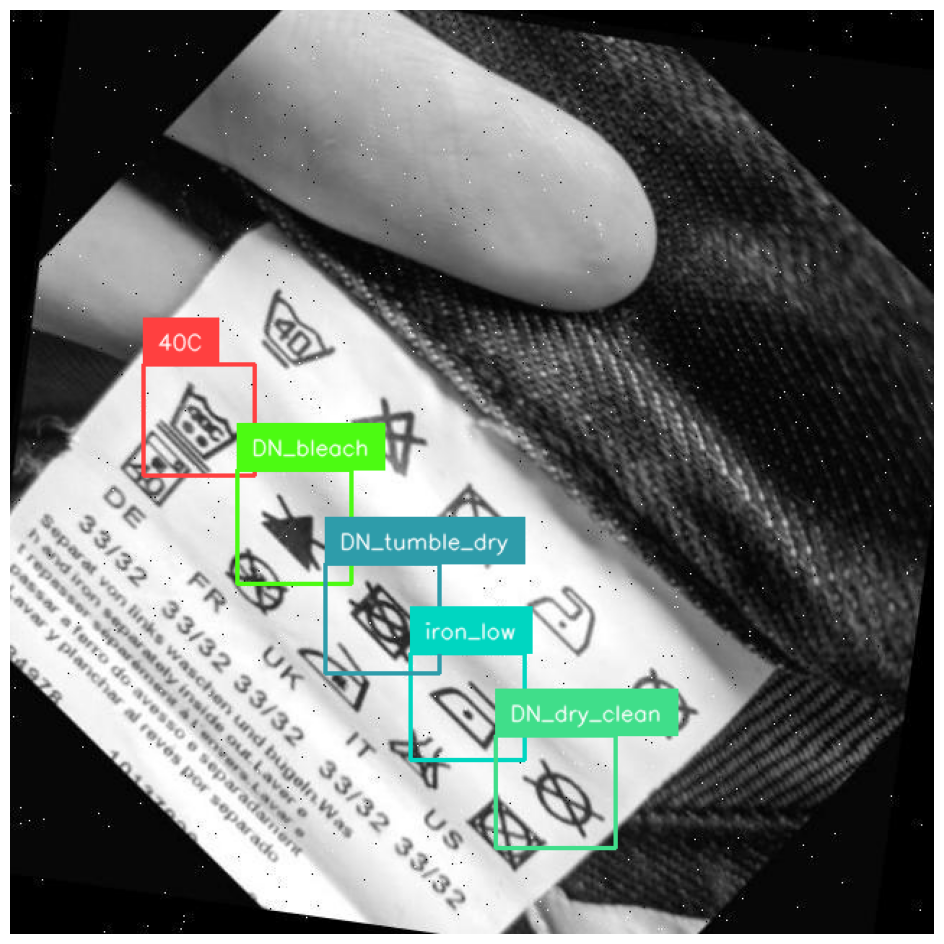

In [ ]:
import random

i = random.randint(0, len(ds))

image_path, image, target = ds[i]

results = model(image, verbose=False)[0]
detections = sv.Detections.from_ultralytics(results).with_nms()

box_annotator = sv.BoxAnnotator()
label_annotator = sv.LabelAnnotator()

annotated_image = image.copy()
annotated_image = box_annotator.annotate(scene=annotated_image, detections=detections)
annotated_image = label_annotator.annotate(scene=annotated_image, detections=detections)

sv.plot_image(annotated_image)

In [ ]:
!zip -r /content/content.zip /content

Streaming output truncated to the last 5000 lines.
  adding: content/wl2-1/train/images/istockphoto-1248252549-612x612_jpeg_jpg.rf.c18dcf364dfbaceb1b780759036f0bf6.jpg (deflated 7%)
  adding: content/wl2-1/train/images/test1_jpg.rf.1d98bbf8d649ae4acd09a112c63d118a.jpg (deflated 5%)
  adding: content/wl2-1/train/images/krimg1_jpg.rf.970c2ca27ab6c27f6ba2d02f91a81199.jpg (deflated 0%)
  adding: content/wl2-1/train/images/istockphoto-1092065154-612x612_jpeg_jpg.rf.54f0a1fabb8115d35d144ab6d09a8a6d.jpg (deflated 0%)
  adding: content/wl2-1/train/images/PXL_20221022_033709641_jpg.rf.343941ded17f3524c254111f1a61e50d.jpg (deflated 1%)
  adding: content/wl2-1/train/images/test42_jpg.rf.0670fd9c7906631fb7ee051679414021.jpg (deflated 0%)
  adding: content/wl2-1/train/images/img44_jpg.rf.7fd238bc75a1a314f524a2ac8b11c0a6.jpg (deflated 2%)
  adding: content/wl2-1/train/images/42_jpg.rf.a30295428d1e2b6d808270d290d855ff.jpg (deflated 1%)
  adding: content/wl2-1/train/images/istockphoto-1048941840-612x6

In [ ]:
from google.colab import files
files.download('/content/content.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from google.colab import files
files.upload()

Saving yolo12-250-64s-content.zip to yolo12-250-64s-content.zip


In [ ]:
!file yolo12-250-64s-content.zip

yolo12-250-64s-content.zip: Zip archive data, at least v1.0 to extract, compression method=store


In [ ]:
!unzip yolo12-250-64s-content.zip -d /content/

Streaming output truncated to the last 5000 lines.
  inflating: /content/content/wl2-1/train/images/img46_jpg.rf.1aab7a52f712d63179bc645b553cfc7c.jpg  
  inflating: /content/content/wl2-1/train/images/istockphoto-1248252549-612x612_jpeg_jpg.rf.c18dcf364dfbaceb1b780759036f0bf6.jpg  
  inflating: /content/content/wl2-1/train/images/test1_jpg.rf.1d98bbf8d649ae4acd09a112c63d118a.jpg  
  inflating: /content/content/wl2-1/train/images/krimg1_jpg.rf.970c2ca27ab6c27f6ba2d02f91a81199.jpg  
  inflating: /content/content/wl2-1/train/images/istockphoto-1092065154-612x612_jpeg_jpg.rf.54f0a1fabb8115d35d144ab6d09a8a6d.jpg  
  inflating: /content/content/wl2-1/train/images/PXL_20221022_033709641_jpg.rf.343941ded17f3524c254111f1a61e50d.jpg  
  inflating: /content/content/wl2-1/train/images/test42_jpg.rf.0670fd9c7906631fb7ee051679414021.jpg  
  inflating: /content/content/wl2-1/train/images/img44_jpg.rf.7fd238bc75a1a314f524a2ac8b11c0a6.jpg  
  inflating: /content/content/wl2-1/train/images/42_jpg.rf.a30

In [ ]:
model = YOLO("/content/content/runs/detect/train/weights/best.pt")

# Validate on the dataset
metrics = model.val(data="/content/content/wl2-1/data.yaml")

precision = metrics.box.mp  # mean precision
recall = metrics.box.mr     # mean recall

print(f"Precision: {precision:.4f}")
print(f"Recall:    {recall:.4f}")

Ultralytics 8.3.63 🚀 Python-3.11.12 torch-2.6.0+cu124 CPU (Intel Xeon 2.20GHz)
YOLOv12s summary (fused): 376 layers, 9,093,171 parameters, 0 gradients, 19.4 GFLOPs


100%|██████████| 755k/755k [00:00<00:00, 67.7MB/s]
val: Scanning /content/content/wl2-1/valid/labels... 352 images, 0 backgrounds, 0 corrupt: 100%|██████████| 352/352 [00:00<00:00, 405.94it/s]

val: New cache created: /content/content/wl2-1/valid/labels.cache
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 62, len(boxes) = 2262. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [01:59<00:00,  5.41s/it]


                   all        352       2262      0.941      0.863       0.91      0.771
                   30C        152        176      0.944      0.966      0.987      0.827
                   40C        137        152      0.978      0.947       0.98      0.802
                   50C          8         15      0.933      0.925      0.954       0.85
                   60C          9         13          1      0.738       0.83      0.676
                   70C          6         11      0.962      0.909      0.981      0.864
                   95C          7         12          1      0.959      0.995      0.887
             DN_bleach        304        364      0.986      0.995      0.982      0.807
                DN_dry          6          6      0.976          1      0.995      0.925
          DN_dry_clean        177        204       0.99      0.979      0.992      0.825
               DN_iron         66         95      0.989      0.935      0.965      0.798
              DN_stea